# Import Packages

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, f1_score
from sklearn.preprocessing import label_binarize
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import graphviz
import seaborn as sns
%matplotlib inline

# Read Dataset

In [2]:
df = pd.read_csv("../datasets/Video_Games_Sales_as_at_22_Dec_2016.csv")

# Shape gives the dimensions

In [3]:
df.shape

(16719, 16)

# Column types an count

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB
None


# NUll Check

In [5]:
print(df.isnull().sum())

Name                  2
Platform              0
Year_of_Release     269
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       8582
Critic_Count       8582
User_Score         6704
User_Count         9129
Developer          6623
Rating             6769
dtype: int64


# Drop all null values

In [6]:
df.fillna(df.mean(numeric_only=True), inplace=True)
df.fillna(df.mode().iloc[0], inplace=True)

# Verify null dropped

In [7]:
print(df.isnull().sum())

Name               0
Platform           0
Year_of_Release    0
Genre              0
Publisher          0
NA_Sales           0
EU_Sales           0
JP_Sales           0
Other_Sales        0
Global_Sales       0
Critic_Score       0
Critic_Count       0
User_Score         0
User_Count         0
Developer          0
Rating             0
dtype: int64


# Visualise distribution of target column

In [8]:
df['Rating'].value_counts()

Rating
E       10760
T        2961
M        1563
E10+     1420
EC          8
K-A         3
RP          3
AO          1
Name: count, dtype: int64

# Define Target and Features

In [9]:
X = df[['Publisher', 'Year_of_Release', 'Genre', 'Developer', 'Platform']]
y = df['Rating']

# Distribute Train and Test and check their dimensions

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train.shape, X_test.shape

((11703, 5), (5016, 5))

# Check types of values in Feature dataset

In [11]:
X_train.head()

,Publisher,Year_of_Release,Genre,Developer,Platform
7408,Telltale Games,2014.0,Adventure,Telltale Games,PS4
2316,Activision,2004.0,Role-Playing,Raven Software,XB
14308,Electronic Arts,2006.0,Sports,EA Canada,GBA
7931,Konami Digital Entertainment,2009.0,Action,Ubisoft,DS
10095,Ubisoft,2005.0,Action,Darkworks,PS2


# Encode Feature set

In [12]:
encoder = ce.OrdinalEncoder(cols=['Publisher', 'Year_of_Release', 'Genre', 'Developer', 'Platform'])
X_train = encoder.fit_transform(X_train)
X_test = encoder.transform(X_test)

# Gini Index

In [13]:
clf_gini = DecisionTreeClassifier(criterion='gini', max_depth=20, random_state=0)
clf_gini.fit(X_train, y_train)
y_pred_gini = clf_gini.predict(X_test)
y_pred_train_gini = clf_gini.predict(X_train)

# Check scores

In [14]:
print('Training set score: {:.4f}'.format(clf_gini.score(X_train, y_train)))
print('Test set score: {:.4f}'.format(clf_gini.score(X_test, y_test)))

Training set score: 0.9847
Test set score: 0.7604


# Tree (Gini index)

In [15]:
dot_data = tree.export_graphviz(
    clf_gini,
    out_file=None,
    feature_names=X_train.columns,
    class_names=list(map(str, y_train.unique())),  # Convert class names to strings
    filled=True,
    rounded=True,
    special_characters=True
)

graph = graphviz.Source(dot_data)
graph

# Entropy

In [16]:
clf_en = DecisionTreeClassifier(criterion='entropy', max_depth=20, random_state=0)
clf_en.fit(X_train, y_train)
y_pred_en = clf_en.predict(X_test)
y_pred_train_en = clf_en.predict(X_train)

# Check scores

In [17]:
print('Training set score: {:.4f}'.format(clf_en.score(X_train, y_train)))
print('Test set score: {:.4f}'.format(clf_en.score(X_test, y_test)))

Training set score: 0.9846
Test set score: 0.7576


# Tree (Entropy)

In [18]:
dot_data = tree.export_graphviz(
    clf_en,
    out_file=None,
    feature_names=X_train.columns,
    class_names=list(map(str, y_train.unique())),  # Convert class names to strings
    filled=True,
    rounded=True,
    special_characters=True
)
graph = graphviz.Source(dot_data)
graph

# Confusion matrix (Entropy)

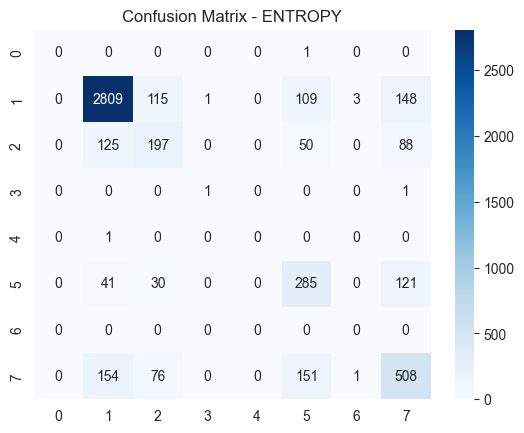

In [19]:
cm = confusion_matrix(y_test, y_pred_en)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - ENTROPY")
plt.show()

# Confusion matrix (Gini index)

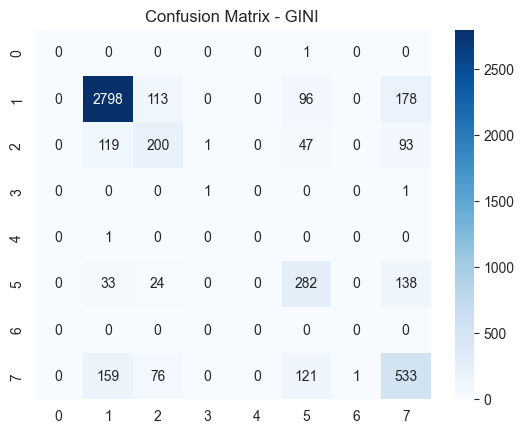

In [20]:
cm = confusion_matrix(y_test, y_pred_gini)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - GINI")
plt.show()

# F1 score of Entropy and Gini index

In [21]:
f1_entropy = f1_score(y_test, y_pred_en, average='weighted')
f1_gini = f1_score(y_test, y_pred_gini, average='weighted')
print(f"F1 Score - Entropy: {f1_entropy}")
print(f"F1 Score - Gini: {f1_gini}")

F1 Score - Entropy: 0.7594146465113765
F1 Score - Gini: 0.7622437715647824


# ROC curve

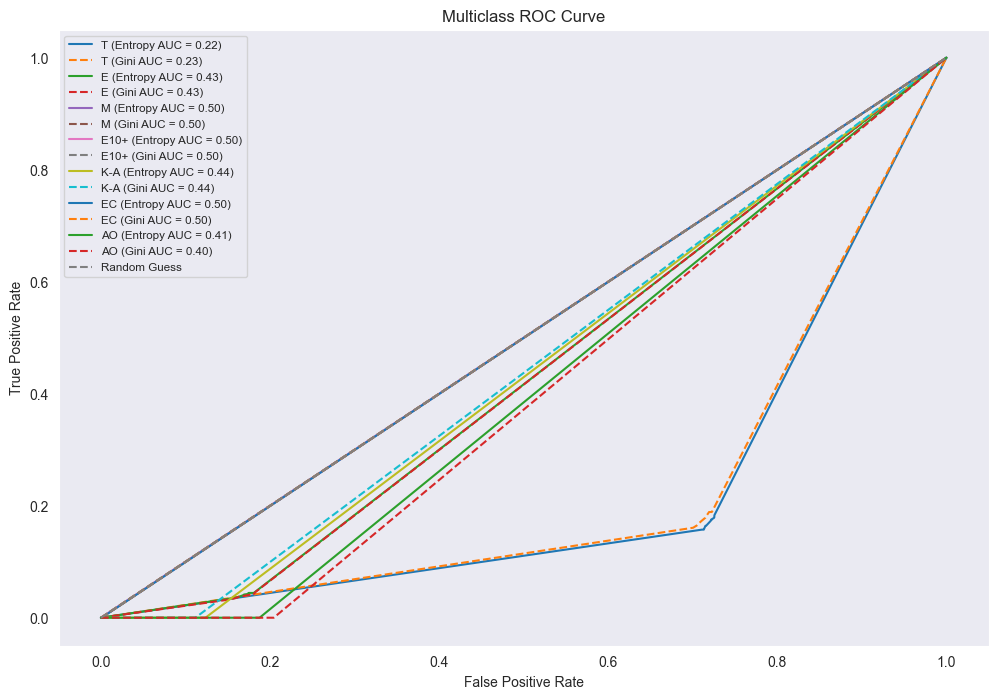

In [22]:
class_labels = y_test.unique()
y_test_bin = label_binarize(y_test, classes=class_labels)
y_proba_entropy = clf_en.predict_proba(X_test)
y_proba_gini = clf_gini.predict_proba(X_test)
plt.figure(figsize=(12, 8))
for i, class_label in enumerate(class_labels):
    fpr_entropy, tpr_entropy, _ = roc_curve(y_test_bin[:, i], y_proba_entropy[:, i])
    auc_entropy = roc_auc_score(y_test_bin[:, i], y_proba_entropy[:, i])
    plt.plot(fpr_entropy, tpr_entropy, label=f'{class_label} (Entropy AUC = {auc_entropy:.2f})', linestyle='-')

    fpr_gini, tpr_gini, _ = roc_curve(y_test_bin[:, i], y_proba_gini[:, i])
    auc_gini = roc_auc_score(y_test_bin[:, i], y_proba_gini[:, i])
    plt.plot(fpr_gini, tpr_gini, label=f'{class_label} (Gini AUC = {auc_gini:.2f})', linestyle='--')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--', label='Random Guess')
plt.title('Multiclass ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best', fontsize='small')
plt.grid()
plt.show()

In [23]:
from sklearn.model_selection import GridSearchCV

params = {'max_depth': [2,4,6,8,10,12],
         'min_samples_split': [2,3,4],
         'min_samples_leaf': [1,2]}

clf = tree.DecisionTreeClassifier()
gcv = GridSearchCV(estimator=clf,param_grid=params)
gcv.fit(X_train, y_train)

C:\Users\Administrator\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [2, 4, 6, 8, 10, 12],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 3, 4]})

In [24]:
from sklearn.metrics import accuracy_score

model = gcv.best_estimator_
model.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')


def plot_confusionmatrix(y_train_pred, y_train, dom):
    pass


plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

Train score 0.8639665043151329
Test score 0.756578947368421


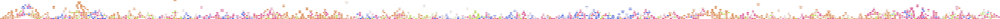

In [53]:
# plt.figure(figsize=(20,20))
# features = df.columns
# classes = list(map(str, y_train.unique()))
# tree.plot_tree(model,feature_names=features,class_names=classes,filled=True)
# plt.show()


dot_data = tree.export_graphviz(
    model,
    out_file=None,
    feature_names=X_train.columns,
    class_names=list(map(str, y_train.unique())),  # Convert class names to strings
    filled=True,
    rounded=True,
    special_characters=True
)
graph = graphviz.Source(dot_data)
graph.render(format='svg',outfile='prepruning.svg').replace('\\', '/')
graph


In [26]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
print(ccp_alphas)

[0.         0.         0.         ... 0.01627733 0.01649267 0.10776974]


In [27]:
# For each alpha we will append our model to a list
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)

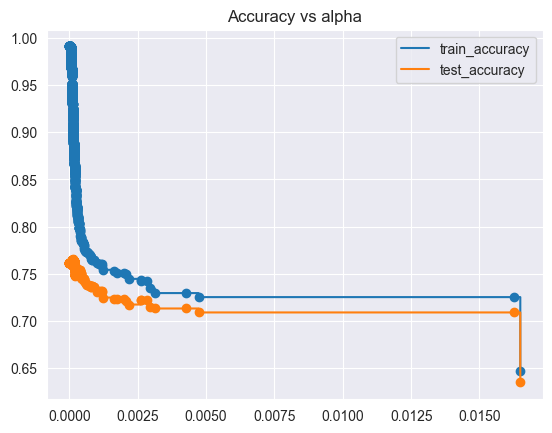

In [29]:
train_acc = []
test_acc = []
for c in clfs:
    y_train_pred = c.predict(X_train)
    y_test_pred = c.predict(X_test)
    train_acc.append(accuracy_score(y_train_pred,y_train))
    test_acc.append(accuracy_score(y_test_pred,y_test))

plt.scatter(ccp_alphas,train_acc)
plt.scatter(ccp_alphas,test_acc)
plt.plot(ccp_alphas,train_acc,label='train_accuracy',drawstyle="steps-post")
plt.plot(ccp_alphas,test_acc,label='test_accuracy',drawstyle="steps-post")
plt.legend()
plt.title('Accuracy vs alpha')
plt.show()

In [66]:
clf_ = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=0.002)
clf_.fit(X_train,y_train)
y_train_pred = clf_.predict(X_train)
y_test_pred = clf_.predict(X_test)

print(f'Train score {accuracy_score(y_train_pred,y_train)}')
print(f'Test score {accuracy_score(y_test_pred,y_test)}')
plot_confusionmatrix(y_train_pred,y_train,dom='Train')
plot_confusionmatrix(y_test_pred,y_test,dom='Test')

Train score 0.7503204306588054
Test score 0.7212918660287081


In [67]:
list(map(str, y_train.unique()))

['M', 'T', 'E', 'E10+', 'K-A', 'RP', 'EC']

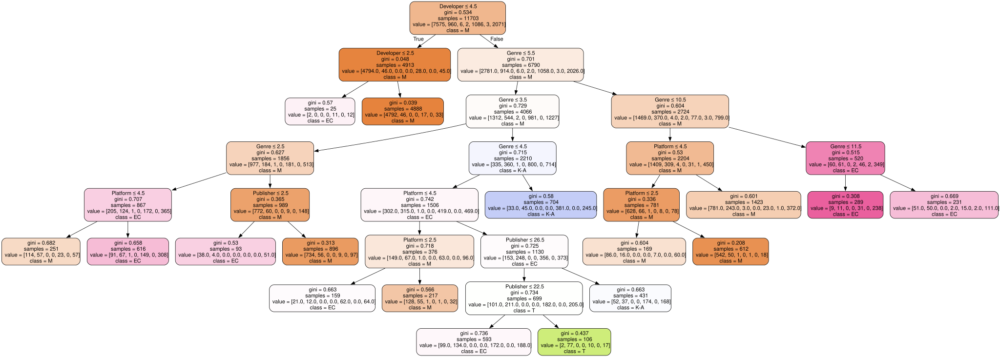

In [68]:
# plt.figure(figsize=(20,20))
# features = df.columns
# classes = list(map(str, y_train.unique()))
# tree.plot_tree(clf_,feature_names=features,class_names=classes,filled=True)
# plt.show()


dot_data = tree.export_graphviz(
    clf_,
    out_file=None,
    feature_names=X_train.columns,
    class_names=['M', 'T', 'E', 'E10+', 'K-A', 'RP', 'EC'],  # Convert class names to strings
    filled=True,
    rounded=True,
    special_characters=True
)
graph = graphviz.Source(dot_data)
graph.render(format='png',outfile='postpruning.png').replace('\\', '/')
graph

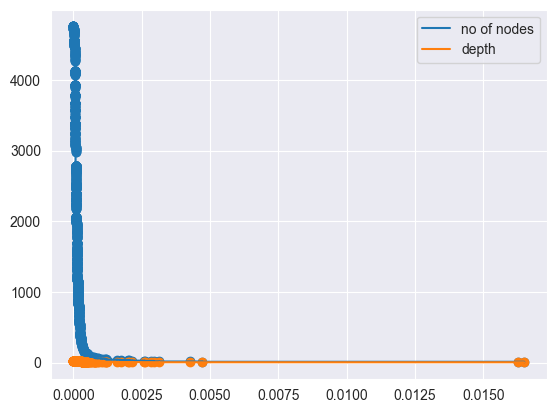

In [28]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
plt.scatter(ccp_alphas,node_counts)
plt.scatter(ccp_alphas,depth)
plt.plot(ccp_alphas,node_counts,label='no of nodes',drawstyle="steps-post")
plt.plot(ccp_alphas,depth,label='depth',drawstyle="steps-post")
plt.legend()
plt.show()